<a href="https://colab.research.google.com/github/EZZRITOE/swahili-news-classification/blob/main/Swahili_News_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#EXPLORING THE DATASET

##Importing the libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
import os 
import nltk
import nltk.corpus
from nltk.corpus import stopwords
from wordcloud import WordCloud ,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize 
import re
import string

In [ ]:
# We load our dataset 
test = pd.read_csv("/content/Test.csv")
train = pd.read_csv("/content/Train.csv")


In [ ]:
# Lets load the first 6 rows for each dataset 

train.head()

,id,content,category
0,SW0,SERIKALI imesema haitakuwa tayari kuona amani...,Kitaifa
1,SW1,"Mkuu wa Mkoa wa Tabora, Aggrey Mwanri amesiti...",Biashara
2,SW10,SERIKALI imetoa miezi sita kwa taasisi zote z...,Kitaifa
3,SW100,KAMPUNI ya mchezo wa kubahatisha ya M-bet ime...,michezo
4,SW1000,WATANZANIA wamekumbushwa kusherehekea sikukuu...,Kitaifa


In [ ]:
print(train)

          id                                            content  category
0        SW0   SERIKALI imesema haitakuwa tayari kuona amani...   Kitaifa
1        SW1   Mkuu wa Mkoa wa Tabora, Aggrey Mwanri amesiti...  Biashara
2       SW10   SERIKALI imetoa miezi sita kwa taasisi zote z...   Kitaifa
3      SW100   KAMPUNI ya mchezo wa kubahatisha ya M-bet ime...   michezo
4     SW1000   WATANZANIA wamekumbushwa kusherehekea sikukuu...   Kitaifa
...      ...                                                ...       ...
5146   SW993   RAIS John Magufuli ameendelea kung’ara katika...   Kitaifa
5147   SW994   KAMPENI inayohimiza watafi ti kuandika upya h...   Kitaifa
5148   SW996   MATUKIO mapya ya malaria kwa kila watu 1,000 ...   Kitaifa
5149   SW997   IMEELEZWA kuwa hakuna sheria yoyote inayokata...   Kitaifa
5150   SW999   Akizungumza mara baada ya kutiwa saini kwa ma...  Biashara

[5151 rows x 3 columns]


In [ ]:
#viewing the top rows of the test dataset
test.head()

,swahili_id,content
0,001dd47ac202d9db6624a5ff734a5e7dddafeaf2,"MKUU wa Wilaya ya Bahi, Mkoani Dodoma, Mwanah..."
1,0043d97f7690e9bc02f0ed8bb2b260d1d44bad92,"MWISHONI mwa wiki hii, Timu ya Soka ya Taifa,..."
2,00579c2307b5c11003d21c40c3ecff5e922c3fd8,THAMANI ya mauzo ya bidhaa za Afrika Masharik...
3,00868eeee349e286303706ef0ffd851f39708d37,MENEJA Mawasiliano na Utetezi wa asasi ya AGP...
4,00a5cb12d3058dcf2e42f277eee599992db32412,"WAZIRI wa Kilimo, Japhet Hasunga amesema seri..."


In [ ]:
#checking for the unique features in the category column
train['category'].unique()

array(['Kitaifa', 'Biashara', 'michezo', 'Kimataifa', 'Burudani'],
      dtype=object)

In [ ]:
#previewing the shape of the dataset
train.shape

(5151, 3)

In [ ]:
#checking the datatypes of the datset
train.dtypes

id          object
content     object
category    object
dtype: object

In [ ]:
#previewing the information in the dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5151 entries, 0 to 5150
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        5151 non-null   object
 1   content   5151 non-null   object
 2   category  5151 non-null   object
dtypes: object(3)
memory usage: 120.9+ KB


# Text pre-processing

#### Lets check for Null Values

In [ ]:
#checking for the null values
train.isnull().any()

id          False
content     False
category    False
dtype: bool

In [ ]:
#inspecting the presence of duplicated data
train.duplicated().any()

False

In [ ]:
#finding missing values
test.isnull().any()

swahili_id    False
content       False
dtype: bool

In [ ]:
#checking the presence of duplicated data
test.duplicated().sum()

0

#### Convert to Lower case 

In [ ]:
# Lets normalise the case of our words to lower case 

train['content'] = train['content'].str.lower()
train.head()

,id,content,category
0,SW0,serikali imesema haitakuwa tayari kuona amani...,Kitaifa
1,SW1,"mkuu wa mkoa wa tabora, aggrey mwanri amesiti...",Biashara
2,SW10,serikali imetoa miezi sita kwa taasisi zote z...,Kitaifa
3,SW100,kampuni ya mchezo wa kubahatisha ya m-bet ime...,michezo
4,SW1000,watanzania wamekumbushwa kusherehekea sikukuu...,Kitaifa


In [ ]:
#normalizing the case of our words to lower case
test['content']=test['content'].str.lower()
test.head()

,swahili_id,content
0,001dd47ac202d9db6624a5ff734a5e7dddafeaf2,"mkuu wa wilaya ya bahi, mkoani dodoma, mwanah..."
1,0043d97f7690e9bc02f0ed8bb2b260d1d44bad92,"mwishoni mwa wiki hii, timu ya soka ya taifa,..."
2,00579c2307b5c11003d21c40c3ecff5e922c3fd8,thamani ya mauzo ya bidhaa za afrika masharik...
3,00868eeee349e286303706ef0ffd851f39708d37,meneja mawasiliano na utetezi wa asasi ya agp...
4,00a5cb12d3058dcf2e42f277eee599992db32412,"waziri wa kilimo, japhet hasunga amesema seri..."


#### Removing Punctuation marks

In [ ]:
 # removing the white spaces,commas except alphabet (small and caps)
 train['content']=train['content'].str.replace("[^a-zA-Z]"," ")

In [ ]:
#confirming the removal
train.head()

,id,content,category
0,SW0,serikali imesema haitakuwa tayari kuona amani...,Kitaifa
1,SW1,mkuu wa mkoa wa tabora aggrey mwanri amesiti...,Biashara
2,SW10,serikali imetoa miezi sita kwa taasisi zote z...,Kitaifa
3,SW100,kampuni ya mchezo wa kubahatisha ya m bet ime...,michezo
4,SW1000,watanzania wamekumbushwa kusherehekea sikukuu...,Kitaifa


In [ ]:
print(train)

          id                                            content  category
0        SW0   serikali imesema haitakuwa tayari kuona amani...   Kitaifa
1        SW1   mkuu wa mkoa wa tabora  aggrey mwanri amesiti...  Biashara
2       SW10   serikali imetoa miezi sita kwa taasisi zote z...   Kitaifa
3      SW100   kampuni ya mchezo wa kubahatisha ya m bet ime...   michezo
4     SW1000   watanzania wamekumbushwa kusherehekea sikukuu...   Kitaifa
...      ...                                                ...       ...
5146   SW993   rais john magufuli ameendelea kung ara katika...   Kitaifa
5147   SW994   kampeni inayohimiza watafi ti kuandika upya h...   Kitaifa
5148   SW996   matukio mapya ya malaria kwa kila watu       ...   Kitaifa
5149   SW997   imeelezwa kuwa hakuna sheria yoyote inayokata...   Kitaifa
5150   SW999   akizungumza mara baada ya kutiwa saini kwa ma...  Biashara

[5151 rows x 3 columns]


In [ ]:
#removing white spaces and commas
test['content']=test['content'].str.replace("[^a-zA-Z]"," ")
test.head()

,swahili_id,content
0,001dd47ac202d9db6624a5ff734a5e7dddafeaf2,mkuu wa wilaya ya bahi mkoani dodoma mwanah...
1,0043d97f7690e9bc02f0ed8bb2b260d1d44bad92,mwishoni mwa wiki hii timu ya soka ya taifa ...
2,00579c2307b5c11003d21c40c3ecff5e922c3fd8,thamani ya mauzo ya bidhaa za afrika masharik...
3,00868eeee349e286303706ef0ffd851f39708d37,meneja mawasiliano na utetezi wa asasi ya agp...
4,00a5cb12d3058dcf2e42f277eee599992db32412,waziri wa kilimo japhet hasunga amesema seri...


In [ ]:
len(test)

1288

#### Tokenization 

In [ ]:
#importing tokenization libraries
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
type(['content'])

list

In [ ]:
#assigning the content column to con_tokens
con_tokens = train['content']


In [ ]:
word=[]
for i in con_tokens: 
    word.append(word_tokenize(i))
    print (con_tokens)

Streaming output truncated to the last 5000 lines.
4        watanzania wamekumbushwa kusherehekea sikukuu...
                              ...                        
5146     rais john magufuli ameendelea kung ara katika...
5147     kampeni inayohimiza watafi ti kuandika upya h...
5148     matukio mapya ya malaria kwa kila watu       ...
5149     imeelezwa kuwa hakuna sheria yoyote inayokata...
5150     akizungumza mara baada ya kutiwa saini kwa ma...
Name: content, Length: 5151, dtype: object
0        serikali imesema haitakuwa tayari kuona amani...
1        mkuu wa mkoa wa tabora  aggrey mwanri amesiti...
2        serikali imetoa miezi sita kwa taasisi zote z...
3        kampuni ya mchezo wa kubahatisha ya m bet ime...
4        watanzania wamekumbushwa kusherehekea sikukuu...
                              ...                        
5146     rais john magufuli ameendelea kung ara katika...
5147     kampeni inayohimiza watafi ti kuandika upya h...
5148     matukio mapya ya malaria kw

In [ ]:
len(con_tokens)

5151

In [ ]:
tokenized_sents = [word_tokenize(i) for i in con_tokens]
for i in tokenized_sents:
    print (i)

['serikali', 'imesema', 'haitakuwa', 'tayari', 'kuona', 'amani', 'na', 'utulivu', 'wa', 'nchi', 'inachezewa', 'huku', 'ikisisitiza', 'uwepo', 'wa', 'umoja', 'kati', 'ya', 'wananchi', 'bila', 'kujali', 'tofauti', 'ya', 'imani', 'kabila', 'au', 'itikadi', 'yoyote', 'hayo', 'yalisemwa', 'na', 'naibu', 'waziri', 'wa', 'mambo', 'ya', 'ndani', 'ya', 'nchi', 'hamad', 'yussuf', 'masauni', 'wakati', 'akifungua', 'semina', 'ya', 'siku', 'mbili', 'iliyofanyika', 'jijini', 'dar', 'es', 'salaam', 'ikiwahusisha', 'viongozi', 'wa', 'taasisi', 'za', 'kiislamu', 'lengo', 'ikiwa', 'ni', 'kuwakumbusha', 'kuhubiri', 'amani', 'katika', 'sehemu', 'zao', 'naibu', 'waziri', 'amesema', 'mwelekeo', 'na', 'malengo', 'ya', 'serikali', 'ya', 'awamu', 'ya', 'tano', 'ni', 'kukuza', 'maendeleo', 'katika', 'sehemu', 'mbalimbali', 'nchini', 'lengo', 'ikiwa', 'kuinua', 'maisha', 'ya', 'wananchi', 'na', 'nchi', 'kwa', 'ujumla', 'serikali', 'hii', 'imejidhatiti', 'kuhakikisha', 'maendeleo', 'yanakuja', 'kwa', 'kasi', 'na'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
#confirming tokenization
len(tokenized_sents)

5151

#### Removing stopwords 

In [ ]:
#  swahili stopwords list
filter_sent=[]

stopwords_swahili=["akasema","alikuwa","amesema","alisema","ambayo","ambapo","ambao","baada","basi","bila","cha","chini","hadi","hapo","hata",
                   "hivyo","hiyo","huku","huo","ili","ilikuwa","juu","kama","karibu","katika","kila",
                   "kima","kisha","kubwa","kutoka","kutokana","kwani","kuwa","kwa","kwamba","kwenda","kwenye","la",
                   "lakini","mara","mdogo","mimi","mkubwa","mmoja","moja","muda","mwenye","na",
                   "naye","ndani","ng","ni","nini","nonkungu","pamoja","pia","sana","sasa","sauti",
                   "tafadhali","tena","tu","vile","wa","wakati","wake","walikuwa","wao","watu","wengine",
                   "wote","ya","yake","yangu","yao","yeye","yule","za","zaidi","zake"]
               

In [ ]:
for i in word:
    l=[]
    for j in i:
        if j not in stopwords_swahili:
# This method appends an element to the end of the list          
            l.append(j) 
    filter_sent.append(' '.join(l))

In [ ]:
train['content'] = filter_sent

In [ ]:
# lets preview our dataset
train.head()

,id,content,category
0,SW0,serikali imesema haitakuwa tayari kuona amani ...,Kitaifa
1,SW1,mkuu mkoa tabora aggrey mwanri amesitisha liki...,Biashara
2,SW10,serikali imetoa miezi sita taasisi zote umma a...,Kitaifa
3,SW100,kampuni mchezo kubahatisha m bet imeingia maku...,michezo
4,SW1000,watanzania wamekumbushwa kusherehekea sikukuu ...,Kitaifa


In [ ]:
#check news category distribution
train.category.value_counts()

Kitaifa      2000
michezo      1720
Biashara     1360
Kimataifa      54
Burudani       17
Name: category, dtype: int64

## Bag of words(BoW)

In [ ]:
#importing heapq to prioritise most frequent word
import heapq

In [ ]:
# Creating the Bag of Words model
#We declare a dictionary to hold our bag of words.
#Next we tokenize each sentence to words.
#Now for each word in sentence, we check if the word exists in our dictionary.
#If it does, then we increment its count by 1. If it doesn’t, we add it to our dictionary and set its count as 1.
word2count = {}
for data in con_tokens:
    words = nltk.word_tokenize(data)
    for word in words:
        if word not in word2count.keys():
            word2count[word] = 1
        else:
            word2count[word] += 1

In [ ]:
print(word2count)

{'serikali': 6245, 'imesema': 240, 'haitakuwa': 31, 'tayari': 1447, 'kuona': 713, 'amani': 403, 'utulivu': 98, 'nchi': 4551, 'inachezewa': 1, 'ikisisitiza': 7, 'uwepo': 242, 'umoja': 400, 'kati': 2641, 'wananchi': 2657, 'kujali': 89, 'tofauti': 899, 'imani': 231, 'kabila': 35, 'au': 1659, 'itikadi': 35, 'yoyote': 446, 'hayo': 4181, 'yalisemwa': 123, 'naibu': 730, 'waziri': 3061, 'mambo': 997, 'hamad': 43, 'yussuf': 22, 'masauni': 46, 'akifungua': 124, 'semina': 139, 'siku': 2115, 'mbili': 1460, 'iliyofanyika': 134, 'jijini': 1367, 'dar': 2810, 'es': 2760, 'salaam': 2740, 'ikiwahusisha': 2, 'viongozi': 1324, 'taasisi': 1422, 'kiislamu': 43, 'lengo': 1347, 'ikiwa': 1673, 'kuwakumbusha': 15, 'kuhubiri': 13, 'sehemu': 917, 'zao': 2179, 'mwelekeo': 60, 'malengo': 462, 'awamu': 579, 'tano': 776, 'kukuza': 464, 'maendeleo': 1972, 'mbalimbali': 2949, 'nchini': 4546, 'kuinua': 119, 'maisha': 567, 'ujumla': 342, 'hii': 1679, 'imejidhatiti': 3, 'kuhakikisha': 1871, 'yanakuja': 13, 'kasi': 532, 'h

In [ ]:
#identifying the frequently used 1000 words
freq_words = heapq.nlargest(1000, word2count, key=word2count.get)
freq_words

['mwaka',
 'serikali',
 'tanzania',
 'timu',
 'vya',
 'nchi',
 'nchini',
 'hilo',
 'hayo',
 'mkuu',
 'mchezo',
 'kazi',
 'sh',
 'huu',
 'fedha',
 'hizo',
 'huyo',
 'rais',
 'taifa',
 'jana',
 'waziri',
 'kufanya',
 'mbalimbali',
 'dar',
 'es',
 'salaam',
 'huduma',
 'afrika',
 'wananchi',
 'kati',
 'hao',
 'mkoa',
 'miaka',
 'biashara',
 'nafasi',
 'asilimia',
 'simba',
 'hatua',
 'ligi',
 'kupata',
 'kwanza',
 'dk',
 'ajili',
 'zao',
 'dhidi',
 'kampuni',
 'mechi',
 'siku',
 'wachezaji',
 'klabu',
 'yanga',
 'kutoa',
 'wilaya',
 'milioni',
 'maendeleo',
 'taarifa',
 'hicho',
 'maeneo',
 'kupitia',
 'kuhakikisha',
 'uwanja',
 'viwanda',
 'ambaye',
 'sekta',
 'sheria',
 'hii',
 'ikiwa',
 'au',
 'vizuri',
 'ujenzi',
 'msimu',
 'nje',
 'kocha',
 'kuna',
 'kuhusu',
 'mradi',
 'kuu',
 'fursa',
 'baadhi',
 'magufuli',
 'michezo',
 'sababu',
 'mchezaji',
 'kuongeza',
 'tatu',
 'benki',
 'mabao',
 'habari',
 'hali',
 'hapa',
 'bilioni',
 'zote',
 'mbili',
 'mkoani',
 'nyingine',
 'kipindi',
 '

In [ ]:
#we construct a vector, which would tell us whether a word in each sentence is a frequent word or not
#X = []
#for data in con_tokens:
#    vector = []
#    for word in freq_words:
 #       if word in nltk.word_tokenize(data):
 #           vector.append(1)
 #       else:
  #          vector.append(0)
 #   X.append(vector)
#X = np.asarray(X)

In [ ]:
#print(vector)

#TF-IDF

In [ ]:
# import required module
from sklearn.feature_extraction.text import TfidfVectorizer
    
# create object
tfidf = TfidfVectorizer()
  
# get tf-df values
result = tfidf.fit_transform(con_tokens)
  
# get idf values
print('\nidf values:')
for ele1, ele2 in zip(tfidf.get_feature_names(), tfidf.idf_):
    print(ele1, ':', ele2)
  
# get indexing
print('\nWord indexes:')
print(tfidf.vocabulary_)
  
# display tf-idf values
print('\ntf-idf value:')
print(result)
  
# in matrix form
print('\ntf-idf values in matrix form:')
print(result.toarray())

Streaming output truncated to the last 5000 lines.
yalipinga : 8.853993087224243
yalipingwa : 8.44852797911608
yalipo : 7.755380798556135
yalipoahirishwa : 8.853993087224243
yalipoanza : 8.853993087224243
yalipoanzisha : 8.853993087224243
yalipobadilishwa : 8.853993087224243
yalipofanyika : 8.44852797911608
yalipofikia : 8.853993087224243
yalipohisi : 8.853993087224243
yalipokelewa : 8.853993087224243
yalipokewa : 8.44852797911608
yalipona : 8.853993087224243
yalipotangazwa : 8.853993087224243
yalipotokea : 8.44852797911608
yalipungua : 8.44852797911608
yalipwe : 7.93770235535009
yalirejesha : 8.853993087224243
yalirindima : 8.853993087224243
yaliripotiwa : 8.44852797911608
yalirithiwa : 8.853993087224243
yalirudisha : 8.853993087224243
yalisababisha : 7.755380798556135
yalisaidia : 7.93770235535009
yalisainiwa : 8.853993087224243
yalisema : 7.93770235535009
yalisemwa : 4.726858702179152
yalishaanza : 8.853993087224243
yalishafanyika : 8.853993087224243
yalishajaa : 8.853993087224243
y

#LEMMATIZATION


In [ ]:
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
# Create WordNetLemmatizer object
wnl = WordNetLemmatizer()
  
# Performing lemmatization 
con_tokens = train['content']

for words in con_tokens:
    print(words , " : " , wnl.lemmatize(words))

serikali imesema haitakuwa tayari kuona amani utulivu nchi inachezewa ikisisitiza uwepo umoja kati wananchi kujali tofauti imani kabila au itikadi yoyote hayo yalisemwa naibu waziri mambo nchi hamad yussuf masauni akifungua semina siku mbili iliyofanyika jijini dar es salaam ikiwahusisha viongozi taasisi kiislamu lengo ikiwa kuwakumbusha kuhubiri amani sehemu zao naibu waziri mwelekeo malengo serikali awamu tano kukuza maendeleo sehemu mbalimbali nchini lengo ikiwa kuinua maisha wananchi nchi ujumla serikali hii imejidhatiti kuhakikisha maendeleo yanakuja kasi maendeleo hayawezi kuja ikiwa amani utulivu haupo sisi serikali tutahakikisha tunalinda amani iliyopo wananchi wapate kufanya shughuli kiuchumi wasiwasi wowote masauni akizungumza ufunguzi shehe mkoa dar es salaam alhaji alhad mussa salum aliihakikishia serikali kutokuwepo mifarakano kati taasisi mbalimbali ilivyokuwepo awali akisisitiza kuendelea umoja jamii ipate kuendelea sisi bakwata tunaihakikishia serikali uwepo umoja ushir

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 :  mahakama wilaya mwanga imeamuru mwili marehemu kapteni mstaafu jeshi wananchi tanzania jwtz marehemu hussein seushi uzikwe kiumeni imani kiislamu uamuzi mahakama unafuatia mariam msuya ambaye mke marehemu wanawe sita kushindwa kuthibitisha nyaraka mumewe kubadili dini uislamu ukristo hakimu mahakama mariam lusewa amekubali hoja tatu upande mleta maombi karim seushi wanazo haki kumzika kaka mke marehemu kushindwa kuthibitisha dhehebu alilohamia mumewe kabla kifo chake uamuzi uliotolewa jana ikiwa siku tangu kufariki kapteni mstaafu seushi mwili ukiendelea kuhifadhiwa hospitali kcmc kusubiri kumalizika kesi hakimu lusewa hoja pili kuzuia upande mke marehemu wanawe kufanya vurugu ama zuio lolote kufanyika mazishi hayo imani kiislamu aidha hakimu huyo haki upande mke marehemu wanawe kushiriki mazishi hayo watapenda mradi wasifanye vurugu aina yoyote kadhalika hakimu lusewa ambaye alisoma maamuzi hayo dakika alitaka upande unaofanya mazishi hayo kufanya gharama zao eneo watakalotenga mk

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



#STEMMING

In [ ]:
# importing modules
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
  
ps = PorterStemmer()
  
con_tokens = train['content']

  
for w in con_tokens:
    print(w, " : ", ps.stem(w))
    

serikali imesema haitakuwa tayari kuona amani utulivu nchi inachezewa ikisisitiza uwepo umoja kati wananchi kujali tofauti imani kabila au itikadi yoyote hayo yalisemwa naibu waziri mambo nchi hamad yussuf masauni akifungua semina siku mbili iliyofanyika jijini dar es salaam ikiwahusisha viongozi taasisi kiislamu lengo ikiwa kuwakumbusha kuhubiri amani sehemu zao naibu waziri mwelekeo malengo serikali awamu tano kukuza maendeleo sehemu mbalimbali nchini lengo ikiwa kuinua maisha wananchi nchi ujumla serikali hii imejidhatiti kuhakikisha maendeleo yanakuja kasi maendeleo hayawezi kuja ikiwa amani utulivu haupo sisi serikali tutahakikisha tunalinda amani iliyopo wananchi wapate kufanya shughuli kiuchumi wasiwasi wowote masauni akizungumza ufunguzi shehe mkoa dar es salaam alhaji alhad mussa salum aliihakikishia serikali kutokuwepo mifarakano kati taasisi mbalimbali ilivyokuwepo awali akisisitiza kuendelea umoja jamii ipate kuendelea sisi bakwata tunaihakikishia serikali uwepo umoja ushir

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




takribani wanatarajiwa kutembelea maonesho viwanda mkoa pwani mapema mwezi ujao mkuu mkoa mhandisi evarist ndikilo maonesho hayo pili viwanda mkoa yatafanyika oktoba mosi saba viwanja vya ccm kibaha namba idadi watafika pale watapara taarifa mbalimbali kuona ambavyo taasisi mbalimbali namna zinaweza zikaonyesha maonyesho hayo jijini dar es salaam mwaka jana wananchi walitembelea maonesho hayo mwaka huu yanatarajiwa kushirikisha wenye viwanda takribani mikoa minne kanda mashariki ukiwemo tanga morogoro pwani dar es salaam mkoa pwani una jumla viwanda vikiwemo vikubwa vya kati vidogo vidogo ametaja miongoni mwa maeneo yenye viwanda rufiji mkuranga bagamoyo kisarawe kibaha chalinze  :  takribani wanatarajiwa kutembelea maonesho viwanda mkoa pwani mapema mwezi ujao mkuu mkoa mhandisi evarist ndikilo maonesho hayo pili viwanda mkoa yatafanyika oktoba mosi saba viwanja vya ccm kibaha namba idadi watafika pale watapara taarifa mbalimbali kuona ambavyo taasisi mbalimbali namna zinaweza zikaon

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



waziri madini doto biteko amewatoa hofu wawekezaji nje kueleza mabadiliko yaliyofanywa sheria madini mwaka hayana lengo kuwakandamiza isipokuwa yamelenga kuifanya rasilimali madini kuwanufaisha wawekezaji watanzania ameyasema hayo kikao baina balozi canada nchini pamela o donnel ambacho kilihudhuriwa naibu waziri madini stanslaus nyongo kamishna madini david mulabwa mkurugenzi idara sera mipango augustine ollal akielezea lengo kuonana uongozi wizara balozi o donnel amefika kupata uelewa mabadiliko mbalimbali yaliyotokea sekta madini maeneo mengine kuwatoa hofu wawekezaji taifa lake wanaopenda kuwekeza nchini nia kupata ufumbuzi masuala sheria madini balozi o donnel alihoji kuhusu masuala mengine ikiwemo utawala kisheria mikataba madini kodi tozo mbalimbali upatikanaji vibali vya kufanya kazi nchini wananchi nchini canada akijibu hoja hizo biteko aliwataka wawekezaji canada kutokuwa wasiwasi mabadiliko hayo kuwataka kutembelea ofisi madini kupata ufafanuzi jambo lolote lenye utata kufan

# Exploratory Data Analysis
### Distribution of the categories

Text(0.5, 1.0, 'Distribution of news categories')

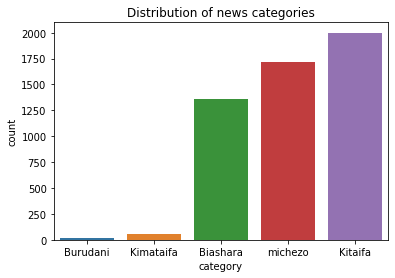

In [ ]:
#Viewing the distribution of the five categories 
import seaborn as sns
sns.countplot(x='category', data=train, order=train['category'].value_counts().sort_values().index)
plt.title('Distribution of news categories')


In [ ]:
# Frequency tables 
train['News_length'] = train['content'].str.len()
print(train['News_length'])

0       1293
1       1081
2       1936
3       1031
4       1728
        ... 
5146    4962
5147    1834
5148    2115
5149     918
5150    1384
Name: News_length, Length: 5151, dtype: int64


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'News length distribution')

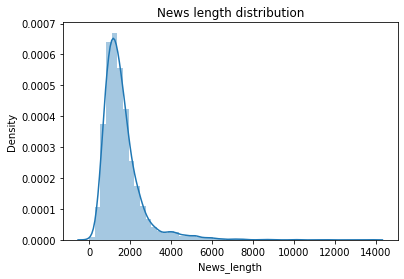

In [ ]:
# Lets plot our frequency distribution 

sns.distplot(train['News_length']).set_title('News length distribution')

## Word Cloud 

In [ ]:
# Lets visualize also our content column using word cloud
# Our column is grouped in five(Kitaifa, kimataifa, biashara, burudani, michezo)
# lets create a function to create wordcloud
def create_wordcloud(words):  # takes input as string
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(words)
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

### Wordcloud - Kitaifa

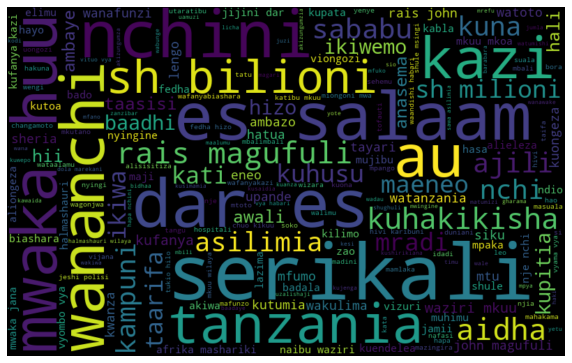

In [ ]:
# wordcloud for category Kitaifa
subset=train[train.category=="Kitaifa"]
# list of sentences
text=subset.content.values 
# convert list of sentences into a paragraph of sentences
words =" ".join(text)
create_wordcloud(words)

#### Kimataifa

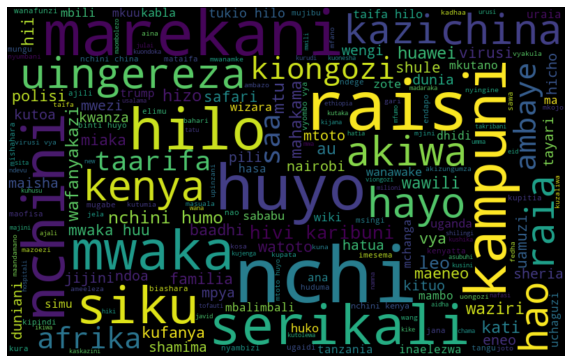

In [ ]:
# wordcloud for category Kitaifa
subset=train[train.category=="Kimataifa"]
# list of sentences
text=subset.content.values 
# convert list of sentences into a paragraph of sentences
words =" ".join(text)
create_wordcloud(words)

####Biashara

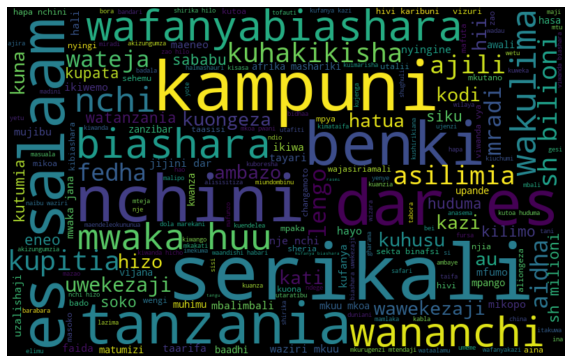

In [ ]:
# wordcloud for category Kitaifa
subset=train[train.category=="Biashara"]
# list of sentences
text=subset.content.values 
# convert list of sentences into a paragraph of sentences
words =" ".join(text)
create_wordcloud(words)

####Michezo 

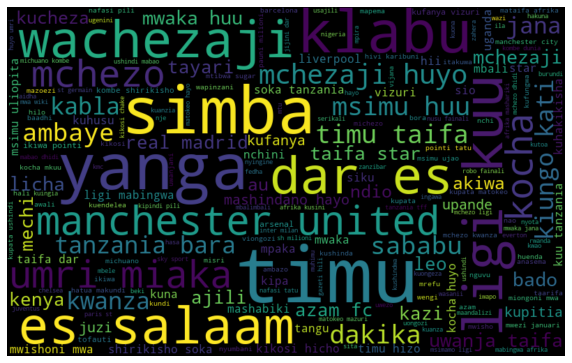

In [ ]:
#michezo word cloud
subset=train[train.category=="michezo"]
text=subset.content.values
words =" ".join(text)
create_wordcloud(words)

####Burudani

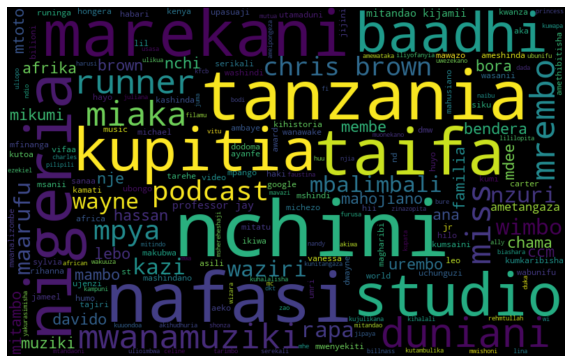

In [ ]:
#burudani word cloud
subset=train[train.category=="Burudani"]
text=subset.content.values
words =" ".join(text)
create_wordcloud(words)

## Numerical Variable


### Measures of Central Tendency

####a)Mean

In [ ]:
# Finding the mean of news length
train["News_length"].mean()

1608.6973403222676

##Measures of Dispersion/ Variabilty/Spread


####a) Standard Deviation

In [ ]:
# Lets check the standard deviation of the news length 
train["News_length"].std()

994.3571713934914

Text(0.5, 1.0, 'No. of characters in a sentence')

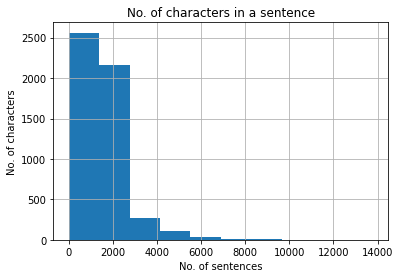

In [ ]:
#having a look at the number of characters present in each sentence
train['content'].str.len().hist()
plt.xlabel('No. of sentences')
plt.ylabel('No. of characters')
plt.title('No. of characters in a sentence')

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5, 1.0, 'Average word per sentence')

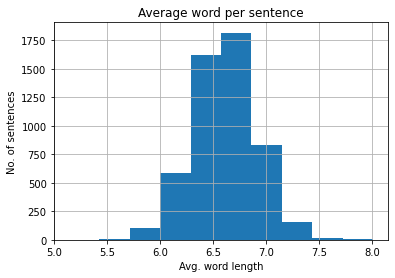

In [ ]:
#Up next, let’s check the average word length in each sentence.
 
train['content'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist()
plt.xlabel('Avg. word length')
plt.ylabel('No. of sentences')
plt.title('Average word per sentence')

#Implementing the Solution
##Preparing our data for modelling


In [ ]:
#dropping News_length and id since we didn't need them for modeling
train.drop(['News_length'], axis = 1, inplace = True)
train.drop(['id'], axis = 1, inplace = True)


In [ ]:
test.drop(['swahili_id'], axis = 1, inplace = True)


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfvectorizer = TfidfVectorizer()
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import hamming_loss, accuracy_score
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from yellowbrick.model_selection import validation_curve
import statsmodels.api as sm


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
label_encoder = preprocessing.LabelEncoder() 
train['category']= label_encoder.fit_transform(train['category']) 
train.head()

,content,category
0,serikali imesema haitakuwa tayari kuona amani ...,3
1,mkuu mkoa tabora aggrey mwanri amesitisha liki...,0
2,serikali imetoa miezi sita taasisi zote umma a...,3
3,kampuni mchezo kubahatisha m bet imeingia maku...,4
4,watanzania wamekumbushwa kusherehekea sikukuu ...,3


In [ ]:
#splitting the independent and dependent variable
X = train["content"]
y = train['category']

In [ ]:
print(X)

0       serikali imesema haitakuwa tayari kuona amani ...
1       mkuu mkoa tabora aggrey mwanri amesitisha liki...
2       serikali imetoa miezi sita taasisi zote umma a...
3       kampuni mchezo kubahatisha m bet imeingia maku...
4       watanzania wamekumbushwa kusherehekea sikukuu ...
                              ...                        
5146    rais john magufuli ameendelea kung ara siasa k...
5147    kampeni inayohimiza watafi ti kuandika upya hi...
5148    matukio mapya malaria jamii yamepungua asilimi...
5149    imeelezwa hakuna sheria yoyote inayokataza taa...
5150    akizungumza kutiwa saini makubaliano hayo jana...
Name: content, Length: 5151, dtype: object


In [ ]:
# initializing TfidfVectorizer 
vetorizar = TfidfVectorizer(max_features=3000, max_df=0.85,ngram_range=(1,2))
# fitting the tf-idf on the given data
vetorizar.fit(X,y)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=0.85, max_features=3000,
                min_df=1, ngram_range=(1, 2), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [ ]:
# splitting the data to training and testing data set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
  
# transforming the data
X_train_tfidf = vetorizar.transform(X_train)
X_test_tfidf = vetorizar.transform(X_test)

In [ ]:
print(X_train_tfidf)

  (0, 2947)	0.048818224102571264
  (0, 2928)	0.15079223560782123
  (0, 2915)	0.04777922794804218
  (0, 2902)	0.046352340183720434
  (0, 2901)	0.045952728358956016
  (0, 2892)	0.06182255250987651
  (0, 2884)	0.038889106021306366
  (0, 2860)	0.3437062021149569
  (0, 2847)	0.06357034915230986
  (0, 2845)	0.09833603474016962
  (0, 2805)	0.041123395494045034
  (0, 2752)	0.07037165189976041
  (0, 2740)	0.08658442021479712
  (0, 2724)	0.07340551513460683
  (0, 2709)	0.06187142237883461
  (0, 2692)	0.04357401197247149
  (0, 2683)	0.07548825216495766
  (0, 2682)	0.15303455274676728
  (0, 2659)	0.10141700281578296
  (0, 2621)	0.060108419137423194
  (0, 2614)	0.16373634640420998
  (0, 2591)	0.06739225738268068
  (0, 2588)	0.05750563420708819
  (0, 2535)	0.04418823292560351
  (0, 2525)	0.08110941192466999
  :	:
  (3604, 819)	0.12023051176486459
  (3604, 778)	0.05714558042930674
  (3604, 751)	0.041511980460384235
  (3604, 727)	0.056823426489253995
  (3604, 693)	0.0440603887823507
  (3604, 656)	0.04

# Random over_sampling Imbalanced Datasets(Smote)

In [ ]:
#SMOTE-Oversampling technique used to create a balance between the minority class and the majority class
!pip install imblearn
from imblearn.over_sampling import SMOTE

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
smote = SMOTE()
features_train_smote, labels_train_smote = smote.fit_sample(X_train_tfidf.astype("float"),y_train)
from collections import Counter
print('Before SMOTE :' , Counter(y_train))
print('After SMOTE :' , Counter(labels_train_smote))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Before SMOTE : Counter({3: 1421, 4: 1188, 0: 938, 2: 43, 1: 15})
After SMOTE : Counter({3: 1421, 0: 1421, 4: 1421, 1: 1421, 2: 1421})


##Multinomial naive bayes
####After SMOTE

In [ ]:
# implementing Multinomial naive bayes after performing SMOTE
from sklearn.naive_bayes import MultinomialNB, GaussianNB
model = MultinomialNB()
model.fit(features_train_smote,labels_train_smote )
model_predictions = model.predict(features_train_smote)

In [ ]:
#the accuracy of our model
print('Accuracy: ', accuracy_score(labels_train_smote, model_predictions))

Accuracy:  0.9004926108374385


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
report= classification_report(labels_train_smote, model_predictions)
print(report)

              precision    recall  f1-score   support

           0       0.75      0.95      0.84      1421
           1       0.99      0.92      0.96      1421
           2       0.97      1.00      0.98      1421
           3       0.86      0.73      0.79      1421
           4       0.97      0.91      0.94      1421

    accuracy                           0.90      7105
   macro avg       0.91      0.90      0.90      7105
weighted avg       0.91      0.90      0.90      7105



###Before SMOTE

In [ ]:
#implementing naive bayes before SMOTE
from sklearn.naive_bayes import MultinomialNB, GaussianNB
model = MultinomialNB()
model.fit(X_train_tfidf, y_train)
model_predictions = model.predict(X_test_tfidf)

In [ ]:
#the accuracy of our model
print('Accuracy: ', accuracy_score(y_test, model_predictions))

Accuracy:  0.8551099611901681


In [ ]:
#evaluating the model
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
report= classification_report(y_test, model_predictions)
print(report)

              precision    recall  f1-score   support

           0       0.79      0.85      0.82       422
           1       0.00      0.00      0.00         2
           2       0.00      0.00      0.00        11
           3       0.81      0.83      0.82       579
           4       0.97      0.91      0.94       532

    accuracy                           0.86      1546
   macro avg       0.51      0.52      0.52      1546
weighted avg       0.85      0.86      0.85      1546



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#K Means

In [ ]:
import matplotlib.cm as cm
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
tfidf = TfidfVectorizer(
    min_df = 5,
    max_df = 0.95,                          
   
    max_features = 3000)

In [ ]:
tfidf.fit(train.content)
text = tfidf.transform(train.content)

In [ ]:
print(text)

  (0, 2989)	0.07614765679547619
  (0, 2957)	0.07058147074400496
  (0, 2953)	0.04085890155690802
  (0, 2938)	0.06203219616938432
  (0, 2912)	0.08093479896382685
  (0, 2902)	0.07135287698408657
  (0, 2871)	0.08003181180185584
  (0, 2828)	0.08931700154183105
  (0, 2812)	0.08222495632613389
  (0, 2785)	0.12694479967074368
  (0, 2633)	0.10435552926331287
  (0, 2588)	0.21773802916452661
  (0, 2576)	0.18096446976928074
  (0, 2550)	0.05909454044915359
  (0, 2495)	0.2779434102480727
  (0, 2443)	0.06580721149745115
  (0, 2411)	0.08283111953712156
  (0, 2361)	0.09829031164093786
  (0, 2330)	0.10394602190282433
  (0, 2305)	0.04448795527723319
  (0, 2286)	0.053267372255394886
  (0, 2263)	0.2497955946605299
  (0, 2213)	0.12489853859903617
  (0, 2202)	0.08090335429726027
  (0, 2191)	0.052914322170829954
  :	:
  (5150, 826)	0.12765041657716106
  (5150, 825)	0.07800934715011189
  (5150, 780)	0.034812977410393985
  (5150, 756)	0.07571789124204009
  (5150, 754)	0.033729903067269335
  (5150, 720)	0.056494

Fit 2 clusters
Fit 4 clusters
Fit 6 clusters
Fit 8 clusters
Fit 10 clusters


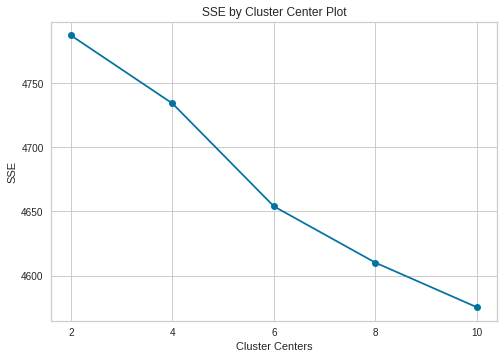

In [ ]:
#One simple approach is to plot the SSE for a range of cluster sizes.
# We look for the "elbow" where the SSE begins to level off. 
#MiniBatchKMeans introduces some noise so we raised the batch and init sizes higher
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 2)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=20).fit(text).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')
    
find_optimal_clusters(text, 10)

In [ ]:
clusters = MiniBatchKMeans(n_clusters=6, init_size=1024, 
                           batch_size=2048,
                           random_state=20).fit_predict(text)

In [ ]:
#Here we plot the clusters generated by our KMeans operation.
# One plot uses PCA which is better at capturing global structure of the data.
#The other uses TSNE which is better at capturing relations between neighbors
def plot_tsne_pca(text, labels):
    max_label = max(labels)
    max_items = np.random.choice(range(text.shape[0]), size=3500, replace=False)
    labels = np.array(['Biashara', 'Kimataifa', 'Kitaifa', 'Michezo', 'Burudani'])

    pca = PCA(n_components=2).fit_transform(text[max_items,:].todense())
    tsne = TSNE().fit_transform(PCA(n_components=50).fit_transform(text[max_items,:].todense()))
    
    
    idx = np.random.choice(range(pca.shape[0]), size=400, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
plot_tsne_pca(text, clusters)


UnboundLocalError: ignored

In [ ]:
def get_top_keywords(text, clusters, labels, n_terms):
    df = pd.DataFrame(text.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(text, clusters, tfidf.get_feature_names(), 10)

#Support Vector Machine

In [ ]:
# Instantiating our model
from sklearn.svm import SVC

svc = SVC(kernel="linear")

# fitting the model
svc.fit(X_train_tfidf, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
# assessing the performance

print("General performance: ",svc.score(X_test_tfidf, y_test))

c_score_svc = cross_val_score(estimator=svc, X=X_train_tfidf, y=y_train, scoring='accuracy', cv=5)

print("Cross validated model performance: ", c_score_svc.mean())

General performance:  0.8641655886157826
Cross validated model performance:  0.8432732316227461


In [ ]:
#Hyperparameter tuning

clf = GridSearchCV(estimator=SVC(),
                   param_grid={'kernel' : ['rbf',"linear", 'sigmoid'],
                               'gamma' : ['scale', 'auto'],
                               'C' : np.arange(1, 10, 2)},
                   scoring='accuracy',
                   cv=5)

clf.fit(X_train_tfidf, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': array([1, 3, 5, 7, 9]),
                         'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'linear', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [ ]:
#evaluating the parameters
compare = pd.DataFrame(clf.cv_results_)
compare = compare[['param_gamma', 'param_kernel', 'param_C', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False)
compare.reset_index(drop=True, inplace=True)
compare

,param_gamma,param_kernel,param_C,mean_test_score
0,scale,rbf,1,0.844660
1,scale,linear,1,0.843273
2,auto,linear,1,0.843273
3,scale,sigmoid,1,0.842718
4,scale,rbf,3,0.842718
5,scale,rbf,5,0.842164
6,scale,rbf,9,0.842164
7,scale,rbf,7,0.842164
8,auto,linear,3,0.829958
9,scale,linear,3,0.829958


#CHALLENGING THE SOLUTION

## Xgboost Model 




###Boosting models are another type of ensemble models part of tree based models. Boosting is a machine learning ensemble meta-algorithm for primarily reducing bias, and also variance in supervised learning, and a family of machine learning algorithms that convert weak learners to strong ones. A weak learner is defined to be a classifier that is only slightly correlated with the true classification (it can label examples better than random guessing).

In [ ]:
#importing the libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.feature_extraction.text import CountVectorizer
from xgboost import XGBClassifier
import pandas as pd
import scipy

In [ ]:
#using countvectorizor to transform text into a vector
cv = CountVectorizer(max_features=5000, encoding="utf-8",  
      ngram_range = (1,3),  
      token_pattern = "[A-Za-z_][A-Za-z\d_]*")
trans = cv.fit_transform(train['content'].values)
labels = train['category']
xgb=XGBClassifier



In [ ]:
#splitting X and y
X = scipy.sparse.hstack([trans])
y = labels


In [ ]:
#getting the train and test splits
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.33, random_state = 42)


In [ ]:
#parameters of the model
xgb_model = xgb(max_depth=50, n_estimators=80, learning_rate=0.1, colsample_bytree=.7, gamma=0, reg_alpha=4, objective='binary:logistic', eta=0.3, silent=1, subsample=0.8).fit(X_train, y_train) 

In [ ]:
#making predictions
xgb_prediction = xgb_model.predict(X_test)

In [ ]:
#evaliating the model performance
from sklearn.metrics import f1_score, classification_report, accuracy_score

print('training score:', f1_score(y_train, xgb_model.predict(X_train), average='macro'))
print('validation score:', f1_score(y_test, xgb_model.predict(X_test), average='macro'))
print(classification_report(y_test, xgb_prediction))

training score: 0.9520854939350765
validation score: 0.5131990736265193
              precision    recall  f1-score   support

           0       0.82      0.75      0.78       466
           1       0.00      0.00      0.00         2
           2       0.00      0.00      0.00        11
           3       0.80      0.86      0.83       632
           4       0.96      0.95      0.96       589

    accuracy                           0.86      1700
   macro avg       0.51      0.51      0.51      1700
weighted avg       0.85      0.86      0.85      1700



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#creating an array of the vector
X = cv.fit_transform(train['content']).toarray()
y = train['category']

In [ ]:
#displaying the array in a dataframe
count_df = pd.DataFrame(labels, columns=cv.get_feature_names())
count_df

,a,abbas,abdallah,abdi,abdul,abeid,abiria,ac,ac milan,ada,adam,adha,adhabu,afc,afcon,africa,african,african lyon,afrika,afrika afcon,afrika caf,afrika kusini,afrika mashariki,afrika mashariki eac,afrika mashariki kati,afrika sadc,afrika wachezaji,afya,afya maendeleo,afya maendeleo jamii,aggrey,agizo,agizo hilo,agosti,agosti mwaka,agosti mwaka huu,ahadi,ahly,ahmed,aibu,...,zilizokuwa,zilizopita,zilizopo,zilizotolewa,zima,zimamoto,zimbabwe,zimeanza,zimekuwa,zina,zinaendelea,zinaonesha,zinatakiwa,zinatarajiwa,zinaweza,zinazoendelea,zinazofanya,zinazofanywa,zinazotokana,zinazotolewa,zinazotumika,zinazowakabili,zinazozalishwa,zingine,zipo,zisizo,zitakazofanyika,zitakuwa,zitto,ziwa,ziwa tanganyika,ziwa victoria,ziwe,ziweze,zoezi,zote,zote mbili,zote nchini,zstc,zuri


# BERT 

We then preprocess the training and validation datasets into the format expected by the selected pretrained model (in this case DistilBERT)

In [ ]:
# Reload our test dataset 

#test = pd.read_csv("/content/Test.csv")

In [ ]:
test.dtypes

content    object
dtype: object

In [ ]:
test.head()

,content
0,mkuu wa wilaya ya bahi mkoani dodoma mwanah...
1,mwishoni mwa wiki hii timu ya soka ya taifa ...
2,thamani ya mauzo ya bidhaa za afrika masharik...
3,meneja mawasiliano na utetezi wa asasi ya agp...
4,waziri wa kilimo japhet hasunga amesema seri...


In [ ]:
test.shape

(1288, 1)

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1288 entries, 0 to 1287
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  1288 non-null   object
dtypes: object(1)
memory usage: 10.2+ KB


In [ ]:
validation_set = test
#  converting our test dataset to lowercase
validation_set["content"] = validation_set["content"].str.lower() # Val_set it means validation set 


Punctuation 

In [ ]:
#  removal of punctuation marks 
validation_set['content']=validation_set['content'].str.replace("[^a-zA-Z]"," ")

In [ ]:
#  previewing our dataset to check if it was converted to lowercase 
validation_set.head() 

,content
0,mkuu wa wilaya ya bahi mkoani dodoma mwanah...
1,mwishoni mwa wiki hii timu ya soka ya taifa ...
2,thamani ya mauzo ya bidhaa za afrika masharik...
3,meneja mawasiliano na utetezi wa asasi ya agp...
4,waziri wa kilimo japhet hasunga amesema seri...


In [ ]:

def processText(tweet):
    
  tweet = tweet.lower()                #convert text to lower-case
  tweet = re.sub('â€˜','',tweet)    # remove the text â€˜ which appears to occur flequently
  tweet = re.sub('â€™','',tweet)    # remove the text â€™ which appears to occur flequently
    

  tweet = word_tokenize(tweet)      
  return ' '.join(tweet)

In [ ]:
# lets apply both training and test set to processtext function

train['content'] = train['content'].apply(processText)   
validation_set['content'] = validation_set['content'].apply(processText)

In [ ]:
validation_set['content']

0       mkuu wa wilaya ya bahi mkoani dodoma mwanahami...
1       mwishoni mwa wiki hii timu ya soka ya taifa ta...
2       thamani ya mauzo ya bidhaa za afrika mashariki...
3       meneja mawasiliano na utetezi wa asasi ya agpa...
4       waziri wa kilimo japhet hasunga amesema serika...
                              ...                        
1283    mkurugenzi msaidizi msajili wa asasi za kirai ...
1284    kilomoni alisema jana kesho atazungumzia suala...
1285    timu ya taifa ya soka ya tanzania bara kiliman...
1286    yanga imetozwa faini ya sh kutokana na makosa ...
1287    mahakama kuu kanda ya dar es salaam imekubalia...
Name: content, Length: 1288, dtype: object

In [ ]:
valid_pred_to = np.zeros((len(validation_set),5))

In [ ]:
#install ktrain wrapper to help us build and deploy our model
!pip install ktrain

     |████████████████████████████████| 25.3 MB 94 kB/s 
     |████████████████████████████████| 6.8 MB 42.2 MB/s 
     |████████████████████████████████| 981 kB 38.0 MB/s 
     |████████████████████████████████| 263 kB 59.3 MB/s 
     |████████████████████████████████| 1.9 MB 57.3 MB/s 
     |████████████████████████████████| 1.2 MB 37.5 MB/s 
     |████████████████████████████████| 468 kB 71.7 MB/s 
     |████████████████████████████████| 3.3 MB 30.3 MB/s 
     |████████████████████████████████| 895 kB 43.2 MB/s 
  Created wheel for ktrain: filename=ktrain-0.27.2-py3-none-any.whl size=25283087 sha256=3c70ee851a1d86f7957a64945d46ca4af5066ca83eee5a377b713339440c6d77
  Stored in directory: /root/.cache/pip/wheels/88/be/4a/971c83a380a40f12e877f643ca1b94dc65f528f94c88dbcff7
  Created wheel for seqeval: filename=seqeval-0.0.19-py3-none-any.whl size=9929 sha256=1b6df0dbf24d26064ca25b163240df57e304fea56a028634e94c4e342abd3ce5
  Stored in directory: /root/.cache/pip/wheels/f5/ac/f1/4e13d7aff0

In [ ]:
#importing libraries needee for our modelling with bert
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from sklearn.utils import class_weight

In [ ]:
#import important API for text 
# import and use text as ktrain
import tensorflow as tf
import ktrain
from ktrain import text
import re
from nltk.tokenize import word_tokenize
from string import punctuation 
from nltk.corpus import stopwords

In [ ]:
# the classweight is used to assign few label to have high loss compared to other

class_weights = class_weight.compute_class_weight('balanced',np.unique(train['category']), train['category'])

class_weight_dict = dict(enumerate(class_weights))

In [ ]:
# appply both training and test set to processtext function

train['content'] = train['content'].apply(processText)   
validation_set['content'] = validation_set['content'].apply(processText)

TRANSFORMERS


The core idea behind the Transformer model is self-attention—the ability to attend to different positions of the input sequence to compute a representation of that sequence. Transformer creates stacks of self-attention layers and is explained below in the sections Scaled dot product attention and Multi-head attention

In [ ]:
#from sklearn.metrics import log_loss
from sklearn.model_selection import KFold, StratifiedKFold
#loading our pretrained model from hugging face
MODEL_NAME = 'bert-base-multilingual-uncased'  


t = text.Transformer(MODEL_NAME, maxlen= 128,  class_names=['kitaifa','michezo','biashara','kimataifa','burudani'])

In [ ]:
 # the parameter of are interest_validation_accuracy and training should stop 
 #if validation accuracy is below best value for 3 else which it continues
es = EarlyStopping(monitor='val_accuracy', patience= 3 , verbose=1, restore_best_weights=True) 


In [ ]:
seed = 42
n_folds = 10  

 # cros validation folds by running 10 folds it will guarantee the best results from developed model

In [ ]:
skf = StratifiedKFold(n_splits= n_folds, random_state=seed, shuffle=False)  # stratified for balanced sampling of training sample

n = 0  # Sometimes some folds produced worse results and then the model is skipped. n will guarantee the average is divided with only episodes contributing to the results

In [ ]:
for train_index, test_index in skf.split(train['content'], train['category']):
    
 #splitting our data into trainning set and test set for our modelling   
    x_train, x_test = list(train.loc[train_index,'content']), list(train.loc[test_index,'content'])
    y_train, y_test = np.asarray(train.loc[train_index,'category']), np.asarray(train.loc[test_index,'category'])
 #preprocessing our splitted data before modelling   
    trn = t.preprocess_train(x_train, y_train)
    val = t.preprocess_test(x_test, y_test)
 
    model = t.get_classifier()

preprocessing train...
language: sw
train sequence lengths:
	mean : 211
	95percentile : 452
	99percentile : 717


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 218
	95percentile : 454
	99percentile : 763



preprocessing train...
language: sw
train sequence lengths:
	mean : 210
	95percentile : 441
	99percentile : 720


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 220
	95percentile : 502
	99percentile : 758


preprocessing train...
language: sw
train sequence lengths:
	mean : 212
	95percentile : 454
	99percentile : 739


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 207
	95percentile : 425
	99percentile : 644


preprocessing train...
language: sw
train sequence lengths:
	mean : 210
	95percentile : 440
	99percentile : 718


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 222
	95percentile : 521
	99percentile : 801


preprocessing train...
language: sw
train sequence lengths:
	mean : 211
	95percentile : 452
	99percentile : 725


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 211
	95percentile : 446
	99percentile : 681


preprocessing train...
language: sw
train sequence lengths:
	mean : 213
	95percentile : 454
	99percentile : 729


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 200
	95percentile : 388
	99percentile : 624


preprocessing train...
language: sw
train sequence lengths:
	mean : 212
	95percentile : 454
	99percentile : 729


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 210
	95percentile : 426
	99percentile : 663


preprocessing train...
language: sw
train sequence lengths:
	mean : 212
	95percentile : 456
	99percentile : 725


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 210
	95percentile : 398
	99percentile : 667


preprocessing train...
language: sw
train sequence lengths:
	mean : 212
	95percentile : 448
	99percentile : 739


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 210
	95percentile : 467
	99percentile : 673


preprocessing train...
language: sw
train sequence lengths:
	mean : 212
	95percentile : 448
	99percentile : 726


Is Multi-Label? False
preprocessing test...
language: sw
test sequence lengths:
	mean : 206
	95percentile : 454
	99percentile : 723


In [ ]:
    learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size= 6)
  
    history = learner.fit(1e-5, 10, cycle_len=1, cycle_mult=2, 
                          class_weight= class_weight_dict, 
                          callbacks=[es], checkpoint_folder='/tmp')
    learner.validate(class_names=t.get_classes())
  


Epoch 1/1023
170/773 [=====>........................] - ETA: 1:44:28 - loss: 1.5291 - accuracy: 0.4588

In [ ]:
  if max(history.history['val_accuracy']) < 0.8:
       # I used any model for testing set if max(history) of validation accuracy is above or equal to 80% else continue and other CV
      continue 

    # make inference if the above condition is met 
    
    predictor = ktrain.get_predictor(learner.model,preproc=t )
    data = validation_set['content']
    data = np.asarray(data)
    print(predictor.get_classes())
    pred = predictor.predict(data,return_proba=True)
    n = n+1

    valid_pred_ro += pred

valid_pred_ro /= n

In [ ]:
#creating a dataframe that stores the values of our output
OUT_df = pd.DataFrame(valid_pred_ro, columns= ['biashara', 'burudani', 'kimataifa', 'kitaifa', 'michezo'])

df_data_out = OUT_df[['kitaifa','michezo','biashara','kimataifa','burudani']]


In [ ]:
SUB_FILE_NAME = 'submission_ro.csv'
sub_df.to_csv(SUB_FILE_NAME, index=False)   

In [ ]:

sub_df = pd.DataFrame(valid_pred_ro, columns= ['biashara', 'burudani', 'kimataifa', 'kitaifa', 'michezo'])  # generate dataframe to store results
sub_df['swahili_id'] = validation_set['swahili_id']

sub_df = sub_df[['swahili_id','kitaifa','michezo','biashara','kimataifa','burudani']]

In [ ]:
# # parameter of interest validation accuracy and training should stop if validation accuracy is below best value for 3 consequetive episode
es = EarlyStopping(monitor='val_accuracy', patience= 3 , verbose=1, restore_best_weights=True)  

In [ ]:
sub_df = pd.DataFrame(valid_pred_ro, columns= ['biashara', 'burudani', 'kimataifa', 'kitaifa', 'michezo'])  # generate dataframe to store results


sub_df = sub_df[['kitaifa','michezo','biashara','kimataifa','burudani']]

In [ ]:
 # print results
sub_df.head()  

In [ ]:
SUB_FILE_NAME = 'submission_ro.csv'
sub_df.to_csv(SUB_FILE_NAME, index=False)   # save output in the kaggle output file